In [1]:
import os
import numpy as np
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow import keras
from tensorflow.keras import Model, Sequential
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import tensorflow as tf


from tqdm import tqdm

**code** :

In [2]:
path = r"D:\faces\data"
image_paths = []

for image_name in os.listdir(path):
    img_path = os.path.join(path,image_name)
    image_paths.append(img_path)


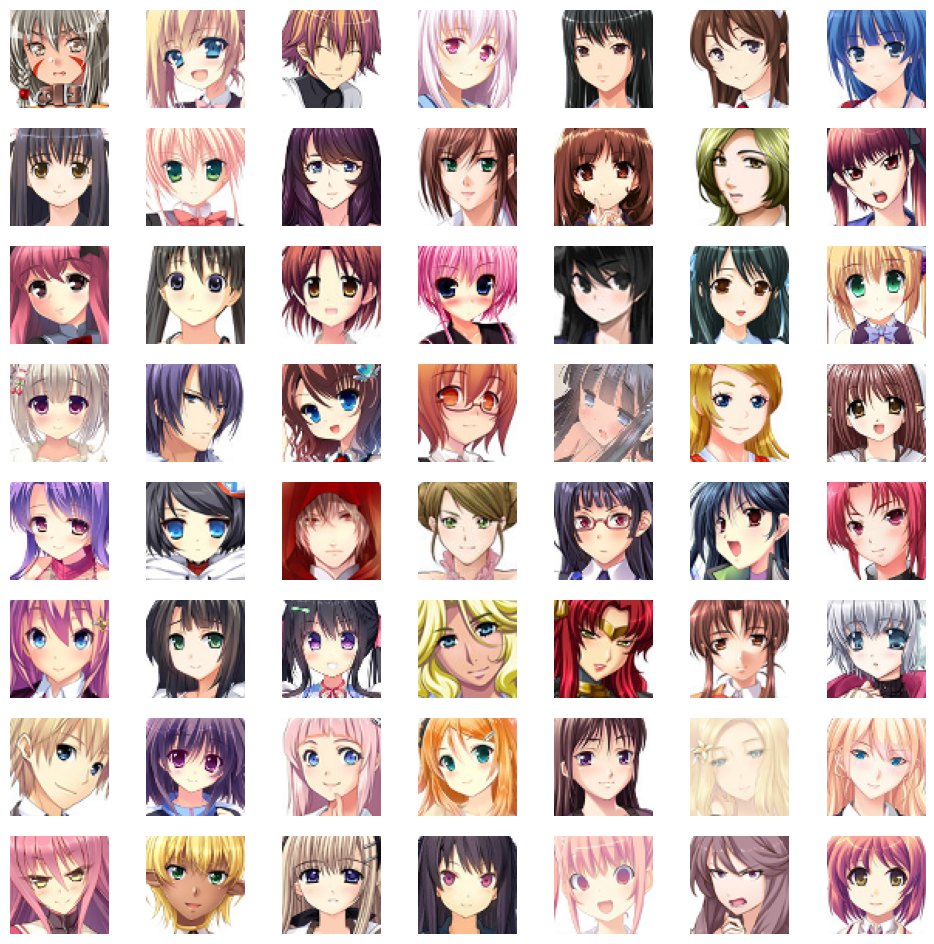

In [3]:
plt.figure(figsize=(12,12))
np.random.shuffle(image_paths)
temp =image_paths[:56]
index = 1

for img_path in temp:
    plt.subplot(8,7,index)
    img = load_img(img_path)
    plt.axis('off')
    plt.imshow(img)
    index += 1

In [4]:
anime_images = [np.array(load_img(path)) for path in tqdm(image_paths)]

100%|██████████| 21561/21561 [00:17<00:00, 1268.13it/s]


In [5]:
anime_images = np.array(anime_images)
anime_images = anime_images.astype('float32')

In [6]:
anime_images = (anime_images - 127.5)/127.5

In [7]:
latent_dim = 100 #----> (64,64,1) :: (8*8*512)
channels = 3
weights_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

In [8]:
#Generator:
model = Sequential(name = 'generator')

model.add(layers.Dense(8*8*512,input_dim = latent_dim))
model.add(layers.ReLU())
model.add(layers.Reshape((8,8,512)))

model.add(layers.Conv2DTranspose(256, (4,4), strides=(2,2), padding = "same", kernel_initializer = weights_init))
model.add(layers.ReLU())


model.add(layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding = "same", kernel_initializer = weights_init))
model.add(layers.ReLU())


model.add(layers.Conv2DTranspose(64, (4,4), strides=(2,2), padding = "same", kernel_initializer = weights_init))
model.add(layers.ReLU())

model.add(layers.Conv2D(channels, (4,4), padding = "same", activation = "tanh"))


generator = model
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             3309568   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 16, 16, 256)       2097408   
 anspose)                                                        
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 32, 32, 128)       524416    
 Transpose)                                              

C:\Users\محمد السحوم\AppData\Roaming\Python\Python311\site-packages\keras\src\initializers\initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [9]:
#Discriminator:
input_dim = (64,64,3)
alpha = 0.2

model_2 = Sequential(name = "discriminator")

model_2.add(layers.Conv2D(64, (4,4), strides=(2,2), padding = "same", input_shape = input_dim))
model_2.add(layers.BatchNormalization())
model_2.add(layers.LeakyReLU(alpha))




model_2.add(layers.Conv2D(128, (4,4), strides=(2,2), padding = "same"))
model_2.add(layers.BatchNormalization())
model_2.add(layers.LeakyReLU(alpha))


model_2.add(layers.Conv2D(128, (4,4), strides=(2,2), padding = "same", input_shape = input_dim))
model_2.add(layers.BatchNormalization())
model_2.add(layers.LeakyReLU(alpha))


model_2.add(layers.Flatten())
model_2.add(layers.Dropout(0.3))
model_2.add(layers.Dense(1, activation = "sigmoid"))



discriminator = model_2
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 batch_normalization (Batch  (None, 32, 32, 64)        256       
 Normalization)                                                  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 batch_normalization_1 (Bat  (None, 16, 16, 128)       512       
 chNormalization)                                                
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)     

In [10]:
#DCGAN:
class DCGAN(Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim

        self.gen_loss_m = keras.metrics.Mean(name = "g_loss")
        self.dis_loss_m = keras.metrics.Mean(name = "d_loss")

    @property
    def metrics(self):
            return [self.gen_loss_m, self.dis_loss_m]
        
    def compile(self, gen_optimizer, dis_optimizer, loss_func):
            super(DCGAN, self).compile()
            self.gen_optimizer = gen_optimizer
            self.dis_optimizer = dis_optimizer
            self.loss_func = loss_func

    def train_step(self, real_anime_images): 
            batch_size = tf.shape(real_anime_images)[0]
            vectors_noise = tf.random.normal(shape = (batch_size, self.latent_dim))

            #Disctiminator on (real images)
            with tf.GradientTape() as tape :
                
                predict_real = self.discriminator(real_anime_images, training = True)
                real_labels = tf.ones((batch_size,1))
                real_labels += 0.05* tf.random.uniform(tf.shape(real_labels))

                dis_loss_real = self.loss_func(real_labels, predict_real) 

                #generate fake images:
                fake = self.generator(vectors_noise)
                predict_fake = self.discriminator(fake, training = True)
                fake_labels = tf.zeros((batch_size,1))
                dis_loss_fake = self.loss_func(fake_labels, predict_fake) 

                dis_loss = (dis_loss_real + dis_loss_fake) / 2
            
            gradients = tape.gradient(dis_loss, self.discriminator.trainable_variables)
            self.dis_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))


            #train the generator:
            labels = tf.ones((batch_size,1))
            with tf.GradientTape() as tape :
                fake_images = self.generator(vectors_noise, training = True)
                predict_fake = self.discriminator(fake_images, training = True)
                gen_loss = self.loss_func(labels, predict_fake)
            
            gradients = tape.gradient(gen_loss, self.generator.trainable_variables)
            self.gen_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

            self.dis_loss_m.update_state(dis_loss)
            self.gen_loss_m.update_state(gen_loss)

            return {'d_loss': self.dis_loss_m.result(), 'g_loss': self.gen_loss_m.result()}

In [11]:

class DCGANCallback(keras.callbacks.Callback):
    def __init__(self, num_samples=10, latent_dim=100):
        super(DCGANCallback, self).__init__()
        self.num_samples = num_samples
        self.latent_dim = latent_dim
        self.noise_vector = tf.random.normal([self.num_samples, self.latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        
        generated_images = self.model.generator(self.noise_vector)
        generated_images = (generated_images * 127.5) + 127.5  

        
        fig = plt.figure(figsize=(8, 8))
        for i in range(self.num_samples):
            plt.subplot(5, 5, i + 1)
            img = array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save("gen_model.keras")



In [22]:
dcgan = DCGAN(generator, discriminator, latent_dim)

lr_gen = 0.0001
lr_dis = 0.0003

dcgan.compile(gen_optimizer = Adam(learning_rate = lr_gen, beta_1 = 0.4),
            dis_optimizer = Adam(learning_rate = lr_dis, beta_1 = 0.4),
            loss_func = BinaryCrossentropy())

Epoch 1/50
10/10 [==============================] - ETA: 0s - d_loss: -0.8383 - g_loss: 26.3836

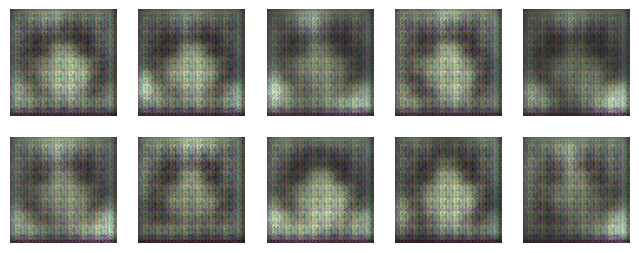

10/10 [==============================] - 17s 1s/step - d_loss: -0.8383 - g_loss: 26.3836
Epoch 2/50
10/10 [==============================] - ETA: 0s - d_loss: -0.7512 - g_loss: 29.8555

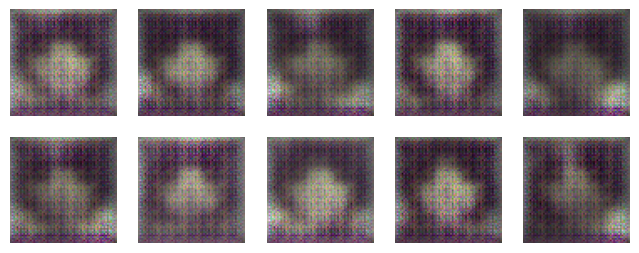

10/10 [==============================] - 13s 1s/step - d_loss: -0.7512 - g_loss: 29.8555
Epoch 3/50
10/10 [==============================] - ETA: 0s - d_loss: 0.5963 - g_loss: 31.5772

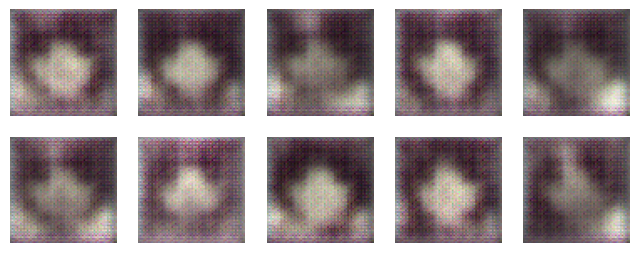

10/10 [==============================] - 13s 1s/step - d_loss: 0.5963 - g_loss: 31.5772
Epoch 4/50
10/10 [==============================] - ETA: 0s - d_loss: 1.9958 - g_loss: 16.9912

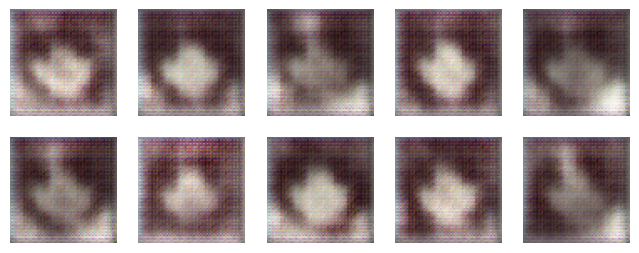

10/10 [==============================] - 14s 1s/step - d_loss: 1.9958 - g_loss: 16.9912
Epoch 5/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0803 - g_loss: 8.0889

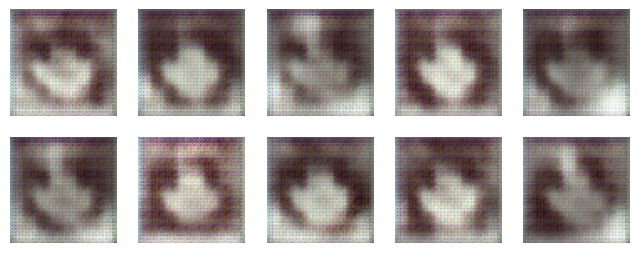

10/10 [==============================] - 13s 1s/step - d_loss: 0.0803 - g_loss: 8.0889
Epoch 6/50
10/10 [==============================] - ETA: 0s - d_loss: 0.3142 - g_loss: 8.9993

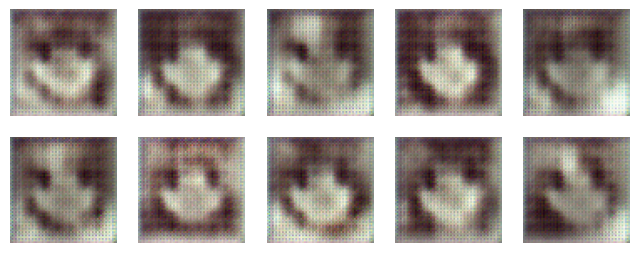

10/10 [==============================] - 14s 1s/step - d_loss: 0.3142 - g_loss: 8.9993
Epoch 7/50
10/10 [==============================] - ETA: 0s - d_loss: 0.4183 - g_loss: 8.3362

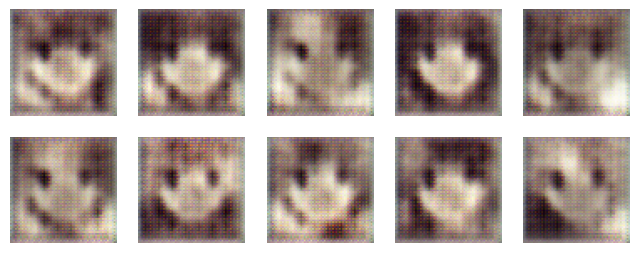

10/10 [==============================] - 13s 1s/step - d_loss: 0.4183 - g_loss: 8.3362
Epoch 8/50
10/10 [==============================] - ETA: 0s - d_loss: 0.4661 - g_loss: 7.8068

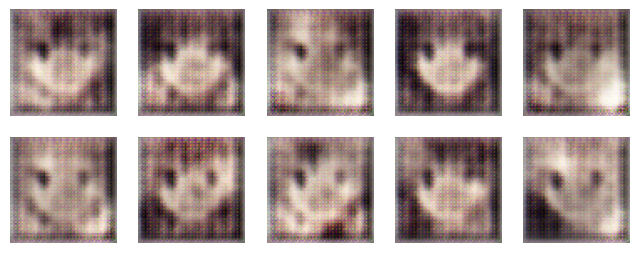

10/10 [==============================] - 13s 1s/step - d_loss: 0.4661 - g_loss: 7.8068
Epoch 9/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0179 - g_loss: 7.6552

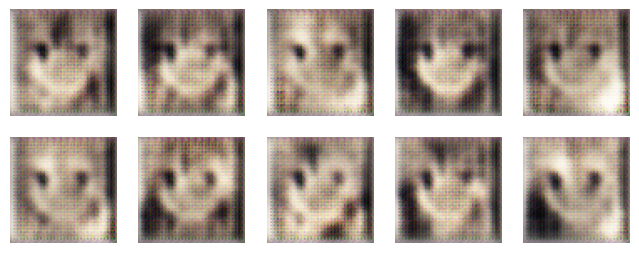

10/10 [==============================] - 13s 1s/step - d_loss: -0.0179 - g_loss: 7.6552
Epoch 10/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0372 - g_loss: 8.7749

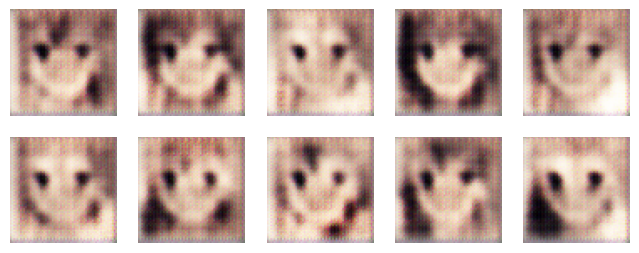

10/10 [==============================] - 14s 1s/step - d_loss: 0.0372 - g_loss: 8.7749
Epoch 11/50
10/10 [==============================] - ETA: 0s - d_loss: 0.5726 - g_loss: 8.6240

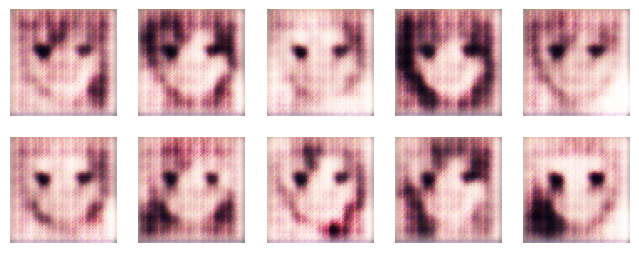

10/10 [==============================] - 13s 1s/step - d_loss: 0.5726 - g_loss: 8.6240
Epoch 12/50
10/10 [==============================] - ETA: 0s - d_loss: 0.1098 - g_loss: 7.2784

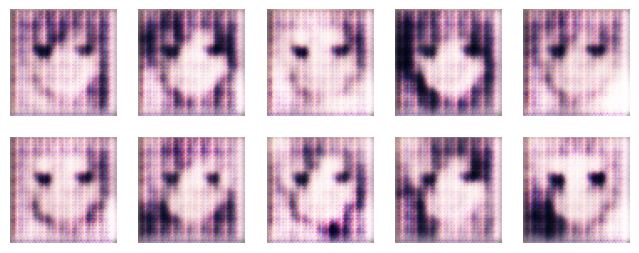

10/10 [==============================] - 13s 1s/step - d_loss: 0.1098 - g_loss: 7.2784
Epoch 13/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0251 - g_loss: 7.9730

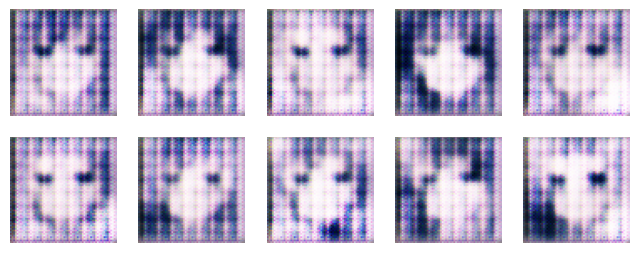

10/10 [==============================] - 13s 1s/step - d_loss: -0.0251 - g_loss: 7.9730
Epoch 14/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0130 - g_loss: 9.2233

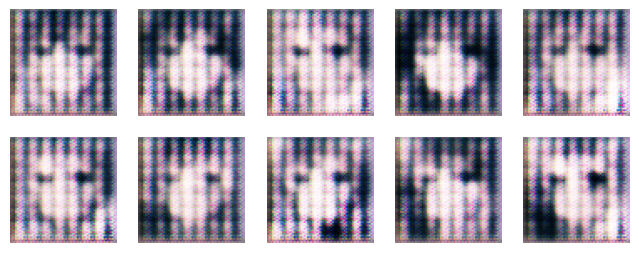

10/10 [==============================] - 13s 1s/step - d_loss: -0.0130 - g_loss: 9.2233
Epoch 15/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0351 - g_loss: 10.3271

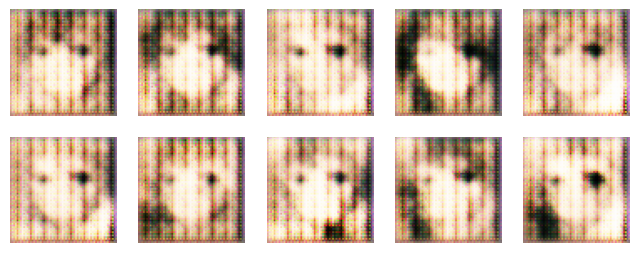

10/10 [==============================] - 14s 1s/step - d_loss: 0.0351 - g_loss: 10.3271
Epoch 16/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0247 - g_loss: 9.7582 

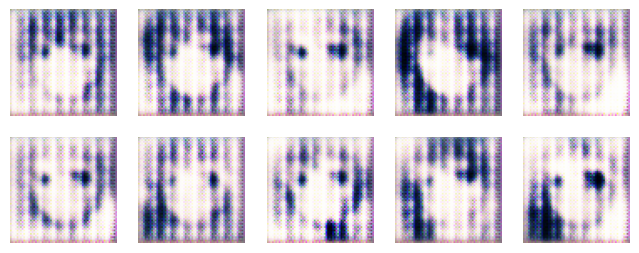

10/10 [==============================] - 13s 1s/step - d_loss: 0.0247 - g_loss: 9.7582
Epoch 17/50
10/10 [==============================] - ETA: 0s - d_loss: 0.1196 - g_loss: 10.7707

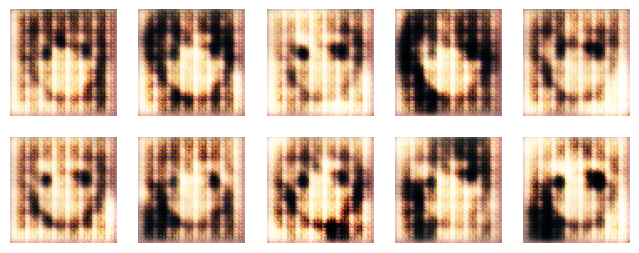

10/10 [==============================] - 13s 1s/step - d_loss: 0.1196 - g_loss: 10.7707
Epoch 18/50
10/10 [==============================] - ETA: 0s - d_loss: 0.2517 - g_loss: 12.6141

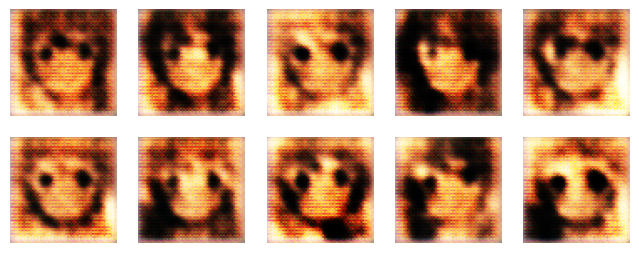

10/10 [==============================] - 13s 1s/step - d_loss: 0.2517 - g_loss: 12.6141
Epoch 19/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0190 - g_loss: 8.9116

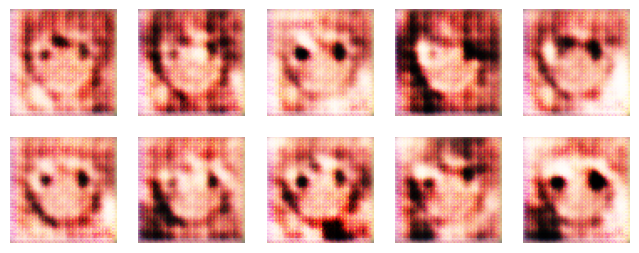

10/10 [==============================] - 13s 1s/step - d_loss: 0.0190 - g_loss: 8.9116
Epoch 20/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0265 - g_loss: 8.7268

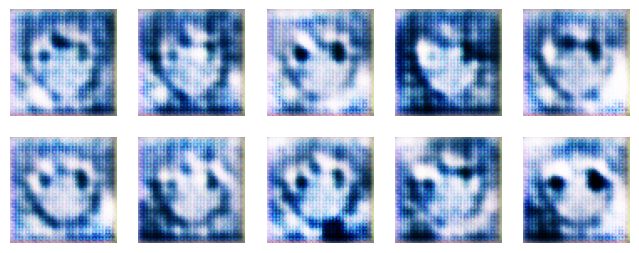

10/10 [==============================] - 13s 1s/step - d_loss: 0.0265 - g_loss: 8.7268
Epoch 21/50
10/10 [==============================] - ETA: 0s - d_loss: 0.3024 - g_loss: 12.7715

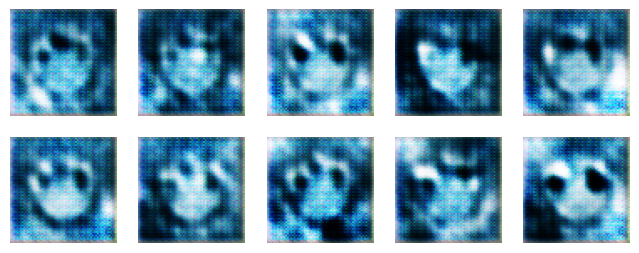

10/10 [==============================] - 13s 1s/step - d_loss: 0.3024 - g_loss: 12.7715
Epoch 22/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0640 - g_loss: 8.3044

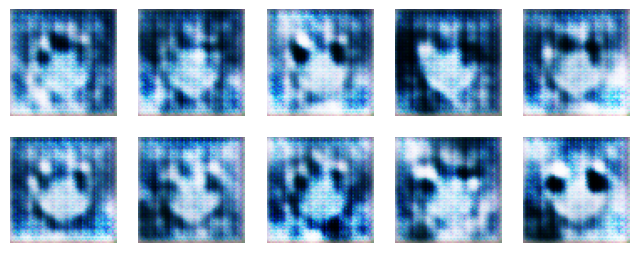

10/10 [==============================] - 13s 1s/step - d_loss: -0.0640 - g_loss: 8.3044
Epoch 23/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0211 - g_loss: 9.3810  

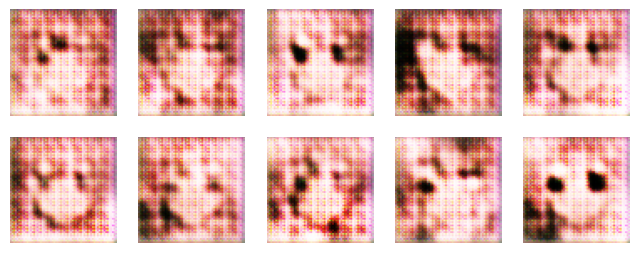

10/10 [==============================] - 13s 1s/step - d_loss: 0.0211 - g_loss: 9.3810
Epoch 24/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0674 - g_loss: 7.9170   

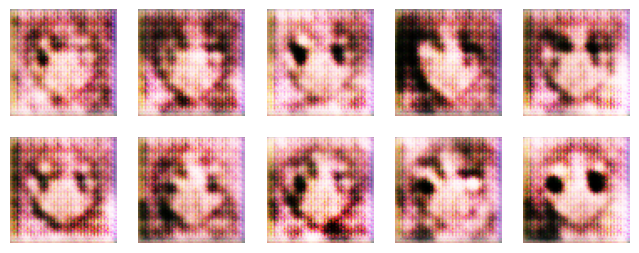

10/10 [==============================] - 14s 1s/step - d_loss: 0.0674 - g_loss: 7.9170
Epoch 25/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0388 - g_loss: 11.2575

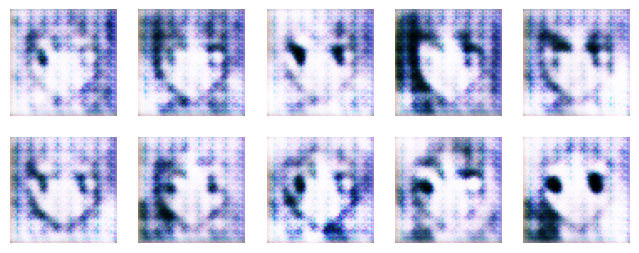

10/10 [==============================] - 13s 1s/step - d_loss: -0.0388 - g_loss: 11.2575
Epoch 26/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0476 - g_loss: 9.2091

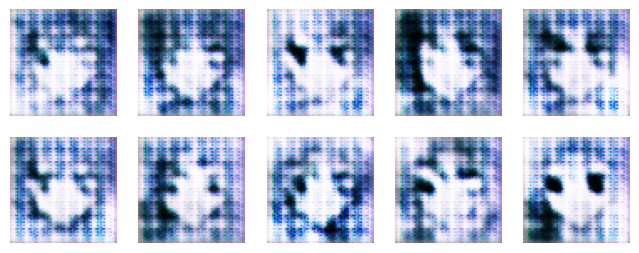

10/10 [==============================] - 13s 1s/step - d_loss: -0.0476 - g_loss: 9.2091
Epoch 27/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0314 - g_loss: 10.2135

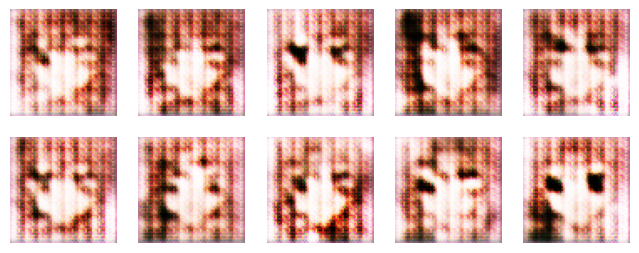

10/10 [==============================] - 14s 1s/step - d_loss: -0.0314 - g_loss: 10.2135
Epoch 28/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0858 - g_loss: 14.1122

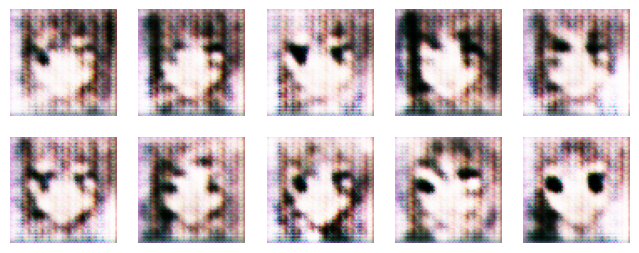

10/10 [==============================] - 13s 1s/step - d_loss: 0.0858 - g_loss: 14.1122
Epoch 29/50
10/10 [==============================] - ETA: 0s - d_loss: 0.1898 - g_loss: 12.2945

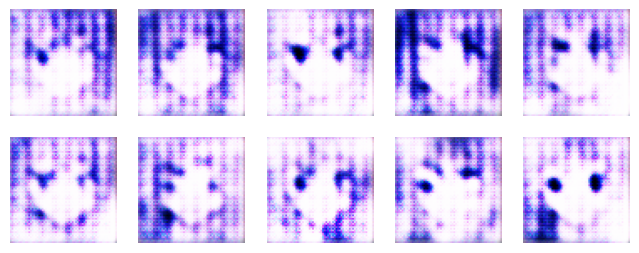

10/10 [==============================] - 13s 1s/step - d_loss: 0.1898 - g_loss: 12.2945
Epoch 30/50
10/10 [==============================] - ETA: 0s - d_loss: -0.1344 - g_loss: 11.7714

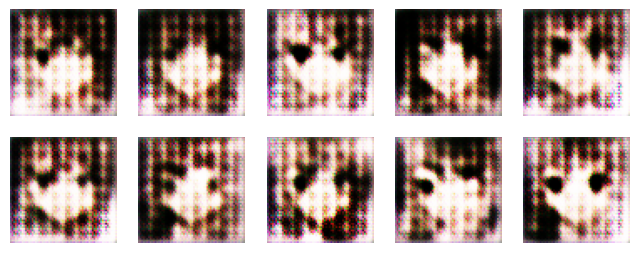

10/10 [==============================] - 12s 1s/step - d_loss: -0.1344 - g_loss: 11.7714
Epoch 31/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0864 - g_loss: 10.3704

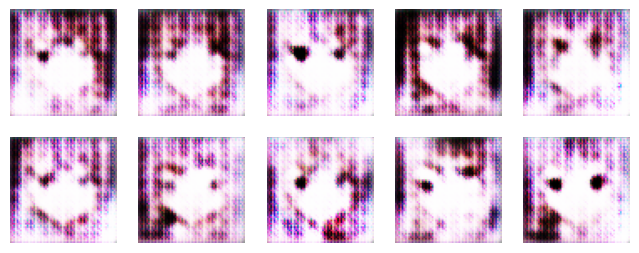

10/10 [==============================] - 12s 1s/step - d_loss: -0.0864 - g_loss: 10.3704
Epoch 32/50
10/10 [==============================] - ETA: 0s - d_loss: -0.1204 - g_loss: 9.6762

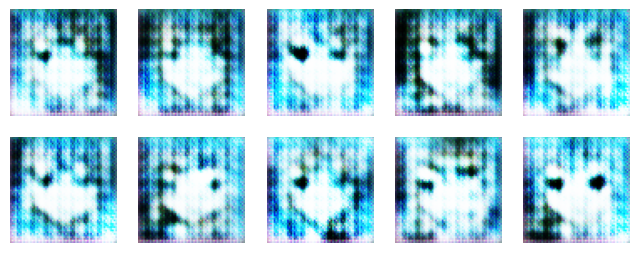

10/10 [==============================] - 12s 1s/step - d_loss: -0.1204 - g_loss: 9.6762
Epoch 33/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0566 - g_loss: 11.5161

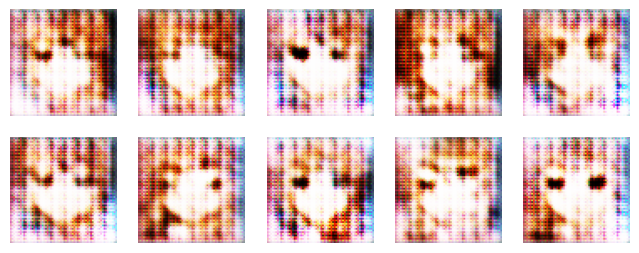

10/10 [==============================] - 13s 1s/step - d_loss: -0.0566 - g_loss: 11.5161
Epoch 34/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0671 - g_loss: 10.6649

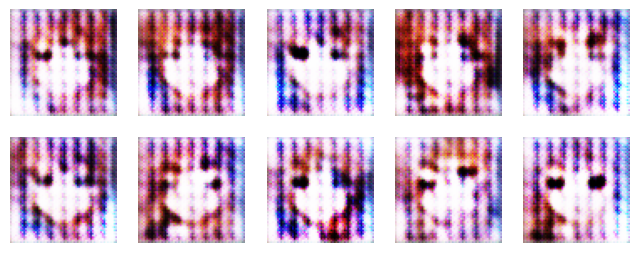

10/10 [==============================] - 12s 1s/step - d_loss: -0.0671 - g_loss: 10.6649
Epoch 35/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0549 - g_loss: 11.4820

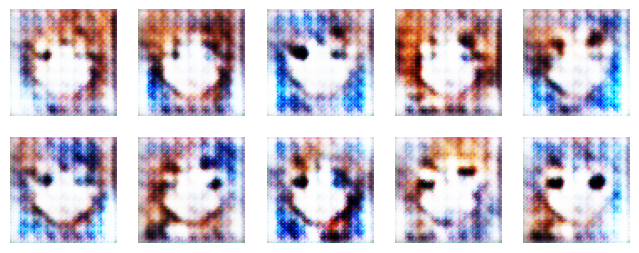

10/10 [==============================] - 12s 1s/step - d_loss: -0.0549 - g_loss: 11.4820
Epoch 36/50
10/10 [==============================] - ETA: 0s - d_loss: 0.1404 - g_loss: 12.7711

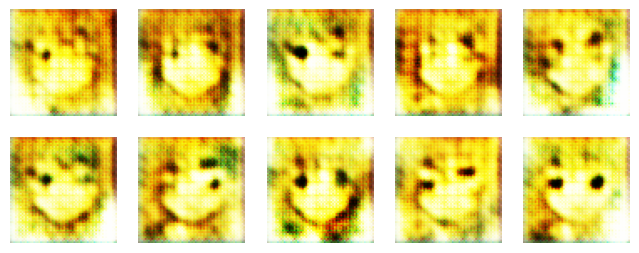

10/10 [==============================] - 12s 1s/step - d_loss: 0.1404 - g_loss: 12.7711
Epoch 37/50
10/10 [==============================] - ETA: 0s - d_loss: 0.1702 - g_loss: 17.2747

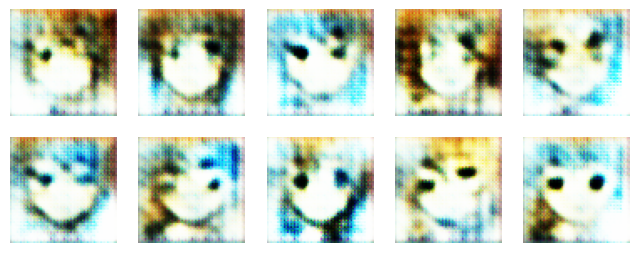

10/10 [==============================] - 14s 1s/step - d_loss: 0.1702 - g_loss: 17.2747
Epoch 38/50
10/10 [==============================] - ETA: 0s - d_loss: 0.3978 - g_loss: 14.1424

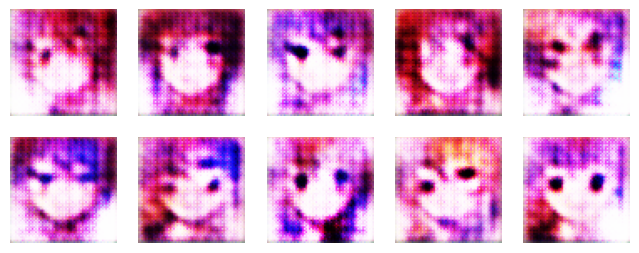

10/10 [==============================] - 12s 1s/step - d_loss: 0.3978 - g_loss: 14.1424
Epoch 39/50
10/10 [==============================] - ETA: 0s - d_loss: 0.1113 - g_loss: 9.9159

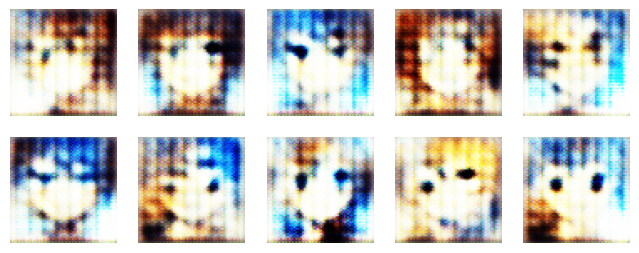

10/10 [==============================] - 12s 1s/step - d_loss: 0.1113 - g_loss: 9.9159
Epoch 40/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0331 - g_loss: 8.9428

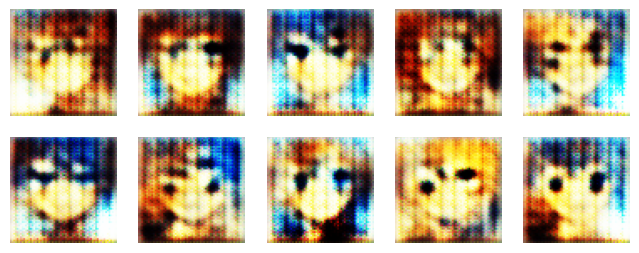

10/10 [==============================] - 12s 1s/step - d_loss: 0.0331 - g_loss: 8.9428
Epoch 41/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0575 - g_loss: 8.6785

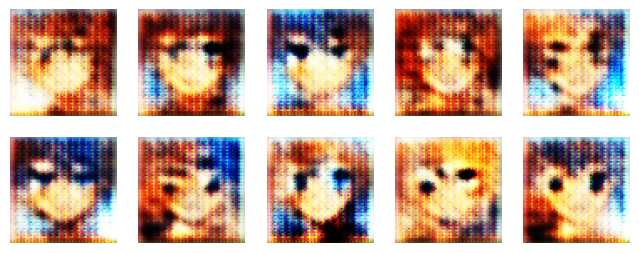

10/10 [==============================] - 12s 1s/step - d_loss: -0.0575 - g_loss: 8.6785
Epoch 42/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0667 - g_loss: 8.9075

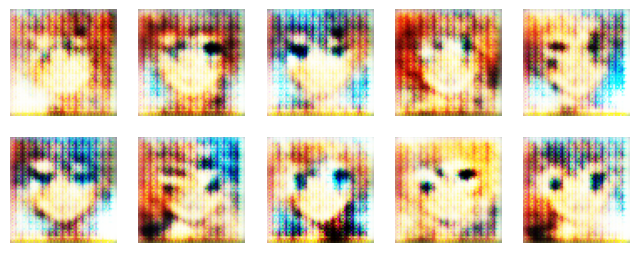

10/10 [==============================] - 12s 1s/step - d_loss: -0.0667 - g_loss: 8.9075
Epoch 43/50
10/10 [==============================] - ETA: 0s - d_loss: -0.0772 - g_loss: 9.7866 

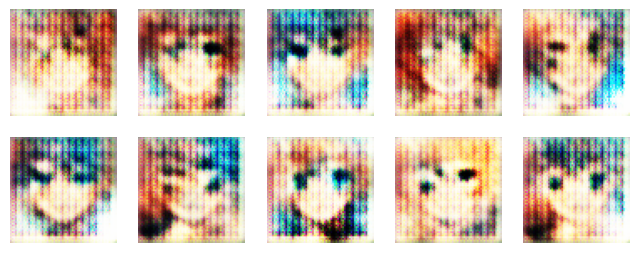

10/10 [==============================] - 12s 1s/step - d_loss: -0.0772 - g_loss: 9.7866
Epoch 44/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0051 - g_loss: 9.7963

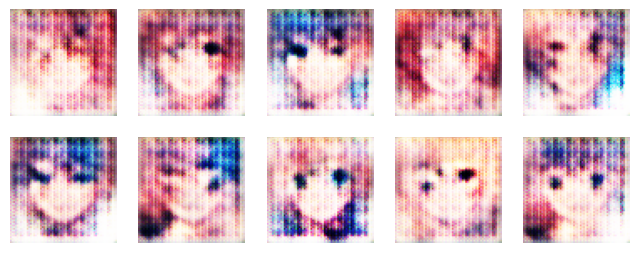

10/10 [==============================] - 12s 1s/step - d_loss: 0.0051 - g_loss: 9.7963
Epoch 45/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0924 - g_loss: 11.3678

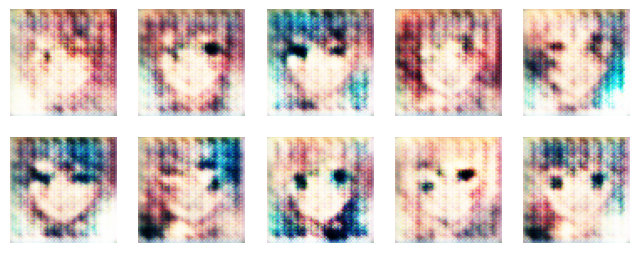

10/10 [==============================] - 12s 1s/step - d_loss: 0.0924 - g_loss: 11.3678
Epoch 46/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0232 - g_loss: 10.4393

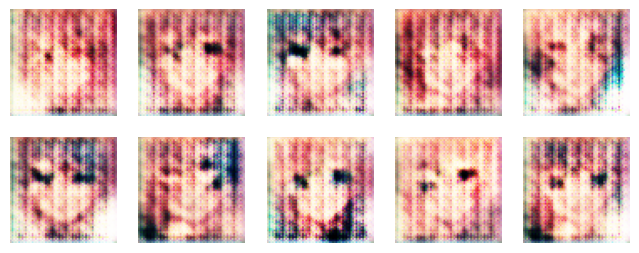

10/10 [==============================] - 12s 1s/step - d_loss: 0.0232 - g_loss: 10.4393
Epoch 47/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0105 - g_loss: 13.6951 

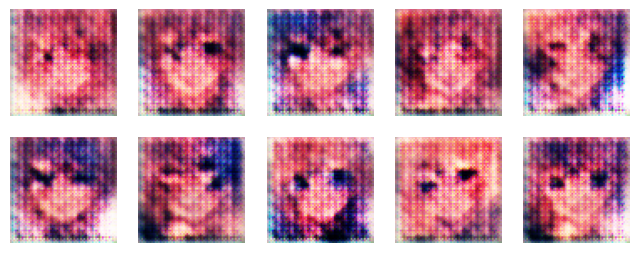

10/10 [==============================] - 13s 1s/step - d_loss: 0.0105 - g_loss: 13.6951
Epoch 48/50
10/10 [==============================] - ETA: 0s - d_loss: 0.1109 - g_loss: 12.0628

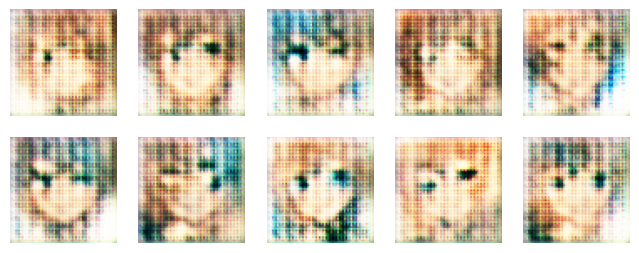

10/10 [==============================] - 12s 1s/step - d_loss: 0.1109 - g_loss: 12.0628
Epoch 49/50
10/10 [==============================] - ETA: 0s - d_loss: -0.1025 - g_loss: 9.7593 

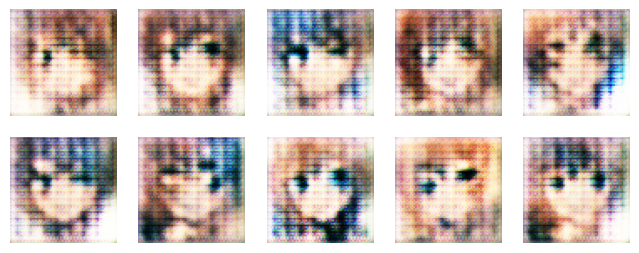

10/10 [==============================] - 12s 1s/step - d_loss: -0.1025 - g_loss: 9.7593
Epoch 50/50
10/10 [==============================] - ETA: 0s - d_loss: 0.0786 - g_loss: 13.0315

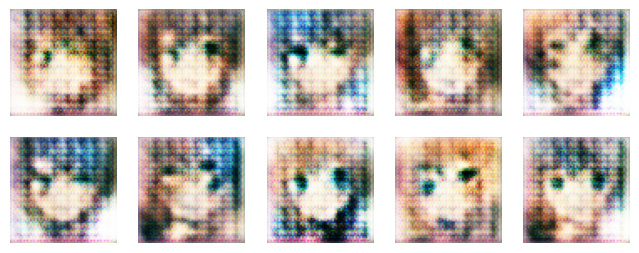

10/10 [==============================] - 12s 1s/step - d_loss: 0.0786 - g_loss: 13.0315


In [23]:
Epochs = 50
dcgan.fit(anime_images[:300], epochs=Epochs, callbacks=[DCGANCallback()])

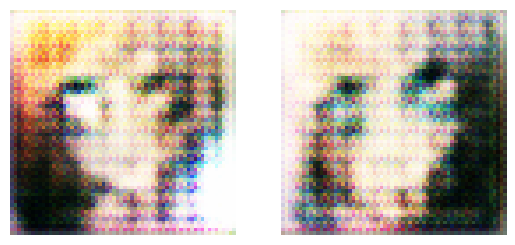

In [24]:
my_gen = tf.keras.models.load_model("gen_model.keras")

def gen_func(model):
    vector = tf.random.normal([2,100])
    img = my_gen(vector)
    img = (img * 127.5) +127.5
    for i in range(len(img)):
        single_image = array_to_img(img[i])
        plt.subplot(1,2,i+1)
        plt.imshow(single_image)
        plt.axis("off")

    plt.show()

gen_func(my_gen)